# Text analysis of the parties in the British Parliament
The following notebook will attempt to elucidate the political activity in the british parliament. More specifically, text mining tools such as TF-IDF will be utilised to try and distinguish important topics within different parties e.g. Liberals and Conservatives. Among other cool stuff that we will figure out on the fly.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import nltk
from wordcloud import WordCloud
import plotly.graph_objs as go
from chart_studio import plotly as py

## Data Fetch

In [2]:
ParlaMint = pd.read_csv("parlamint_preprocess.csv")
ParlaMint

,Unnamed: 0,ID,Title,From,To,House,Term,Subcorpus,Speaker_role,Speaker_type,Speaker_party,Speaker_party_name,Party_status,Speaker_name,Speaker_gender,Speaker_birth,Text,tokens
0,0,ParlaMint-GB_2015-01-05-commons.u1,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,1. What progress her Department has made on im...,"['progress', 'depart', 'made', 'implement', 'e..."
1,1,ParlaMint-GB_2015-01-05-commons.u2,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,The Government are on track to deliver their c...,"['govern', 'track', 'deliv', 'commit', 'introd..."
2,2,ParlaMint-GB_2015-01-05-commons.u3,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LD,Liberal Democrat,Coalition,"Willott, Jennifer Nancy",F,-,"It is clear that exit checks, which were scrap...","['clear', 'exit', 'check', 'scrap', 'previou',..."
3,3,ParlaMint-GB_2015-01-05-commons.u4,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,CON,Conservative,Coalition,"May, Theresa Mary",F,-,"As I indicated in my original answer, we are o...","['indic', 'origin', 'answer', 'track', 'ensur'..."
4,4,ParlaMint-GB_2015-01-05-commons.u5,"Minutes of the House of Commons, Daily Session...",2015-01-05,2015-01-05,Lower house,55,Reference,Regular,MP,LAB,Labour,Opposition,"Cunningham, Alexander",M,-,19. Given the situation at our border in Calai...,"['given', 'situat', 'border', 'calai', 'home',..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
552098,552098,ParlaMint-GB_2021-03-01-lords.u223,"Minutes of the House of Lords, Daily Session 2...",2021-03-01,2021-03-01,Upper house,58,COVID,Regular,notMP,LAB,Labour,Opposition,"Hendy, John",M,-,"My Lords, an increase in the national minimum ...","['lord', 'increas', 'nation', 'minimum', 'wage..."
552099,552099,ParlaMint-GB_2021-03-01-lords.u224,"Minutes of the House of Lords, Daily Session 2...",2021-03-01,2021-03-01,Upper house,58,COVID,Regular,MP,CON,Conservative,Opposition,"Balfe, Richard",M,-,"My Lords, the Opposition are struggling to fin...","['lord', 'opposit', 'struggl', 'find', 'someth..."
552100,552100,ParlaMint-GB_2021-03-01-lords.u225,"Minutes of the House of Lords, Daily Session 2...",2021-03-01,2021-03-01,Upper house,58,COVID,Regular,MP,LAB,Labour,Opposition,"Liddle, Roger John",M,-,"My Lords, I will associate myself with the com...","['lord', 'associ', 'comment', 'nobl', 'lord', ..."
552101,552101,ParlaMint-GB_2021-03-01-lords.u226,"Minutes of the House of Lords, Daily Session 2...",2021-03-01,2021-03-01,Upper house,58,COVID,Regular,MP,LAB,Labour,Opposition,"Lennie, Christopher",M,-,"My Lords, I will make some brief comments and ...","['lord', 'make', 'brief', 'comment', 'question..."


Unfortunately, to be able to compute the tfidf, we will have to subset the data. Otherwise, the computations will take to long time. Hence, we will only investigate the speeches within the parliament in the year 2020.

In [3]:
ParlaMint['date'] = pd.to_datetime(ParlaMint['From'])
start_date = "2020-01-01" 
end_date = "2020-12-30"
mask = (ParlaMint['date'] > start_date) & (ParlaMint['date'] <= end_date)
ParlaMint = ParlaMint.loc[mask]

## Data manipulations
Each observation in the dataframe consist of a specific speach associated with metadata e.g. speaker name, speaker party etc. Initially, we will create one document for each party by concatenating all of the speaches conducted by the members of the same parties. This would yield a corpus consisting of:

In [32]:
print(f'Number of documents in the corpus: {len(ParlaMint.Speaker_party_name.unique())}')

Number of documents in the corpus: 48


We may run into memory issues given that we have a lot of text but lets see what happens.

In [33]:
import ast 
corpus = {}
parties = ParlaMint.Speaker_party_name.unique()
for party in tqdm(parties):
    document = []
    temp = ParlaMint[ParlaMint['Speaker_party_name']==party]
    for tokens in temp['tokens']:
        for token in ast.literal_eval(tokens):
            document.append(token)
    corpus[party] = document

100%|████████████████████████████████████████████████████████████████| 48/48 [02:38<00:00,  3.31s/it]


Ensuring that we have a document for each pary:

In [38]:
corpus.keys(), len(corpus.keys())

(dict_keys(['Labour', 'Conservative', 'Liberal Democrat', 'Conservative;Independent', 'Scottish National Party', 'Democratic Unionist Party', 'Green Party', 'Plaid Cymru', 'Independent', 'Crossbench', nan, 'Non-affiliated', 'Labour;Non-affiliated', 'Bishops', 'Independent Labour', 'Independent Social Democrat', 'Ulster Unionist Party', 'Alliance', 'Social Democratic & Labour Party', '-', 'Non-affiliated;Labour', 'Liberal Democrat;Non-affiliated', 'UK Independence Party;Non-affiliated', 'Crossbench;Non-affiliated', 'Conservative;Non-affiliated', 'Labour Independent', 'Non-affiliated;Liberal Democrat', 'Independent Ulster Unionist', 'Conservative;Independent Conservative;Non-affiliated', 'Plaid Cymru;Independent', 'Liberal Democrat;Non-affiliated;Crossbench', 'Liberal Democrat;Crossbench', 'Conservative;Crossbench', 'Non-affiliated;Crossbench', 'Scottish National Party;Independent', 'Labour;Independent', 'Independent;Conservative']),
 37)

Now we have a document for each party and a combined corpus of 37 documents. The next step is to compute the tf-idf weightings of all terms in the corpus. However, lets first just use the term frequency for each document, so we can compare and see the importance of the IDF weight. Notice: we will narrow the scope of the rest of the analysis to the 4 of the major parties, but still compute the IDF based on the entire corpus.

In [39]:
Chosen_parties = ['Conservative','Labour','Liberal Democrat','Scottish National Party']
for i in Chosen_parties:
    fdist = nltk.FreqDist(corpus[i]) #Only gives raw counts, but we want normalized
    dict_fdist = dict(fdist)
    total_count = sum(dict_fdist.values())
    for k, v in dict_fdist.items():
        fdist[k] = v / total_count
    print(f'The 5 most frequent words associated with the ${i.upper()} party')
    print(fdist.most_common(10))
    print('\n')

The 5 most frequent words associated with the $CONSERVATIVE party
[('hon', 0.008824701484394865), ('govern', 0.008230690668106467), ('lord', 0.007972903553903262), ('friend', 0.00752171756928058), ('nobl', 0.007024874466338529), ('right', 0.0068106372188399536), ('work', 0.0064243077561376045), ('peopl', 0.006352895340304746), ('support', 0.005724466080975592), ('would', 0.005428982576775371)]


The 5 most frequent words associated with the $LABOUR party
[('govern', 0.013028660218463621), ('minist', 0.008995072230786709), ('lord', 0.007313229728838321), ('peopl', 0.0070400891249483896), ('need', 0.006350641196346073), ('would', 0.005704192146352547), ('support', 0.004920928482603778), ('hous', 0.004897474548817164), ('member', 0.004774830020057999), ('nobl', 0.004672219059741567)]


The 5 most frequent words associated with the $LIBERAL DEMOCRAT party
[('lord', 0.016132326485161674), ('govern', 0.01314423687604744), ('nobl', 0.010354793673531626), ('minist', 0.009295812477792171), ('wo

Non-suprisingly, the term frequencies does not provide a lot of usefull insights as a description of the documents. Subsequently, the TF-IDF will be computed for each of the chosen five documents:

In [43]:
def TFIDF():
    N = len(corpus.keys()) #Number of documents
    temp = []
    #Taking all terms in our five documents
    for i in Chosen_parties:
        temp.append(corpus[i])
    terms = set([item for sublist in temp for item in sublist])

    #Computing the idf associated with each term
    idf_dict = {}
    for term in tqdm(terms):
        counter = 0
        for i in corpus.keys():
            if term in set(corpus[i]):
                counter += 1
        idf_dict[term] = np.log((N)/(counter))
    return idf_dict
idf_dict = TFIDF()

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 32115/32115 [3:09:12<00:00,  2.83it/s]


In [44]:
#Storing IDF_dict
import pickle
with open('idf_dict.p', 'wb') as fp:
    pickle.dump(idf_dict, fp, protocol=pickle.HIGHEST_PROTOCOL)

We're ready to calculate the TF-IDF of the five documents, and will also compare the results with the previously computed term frequency:

In [46]:
for i in Chosen_parties:
    print(f'###########\n## {i} ##\n##########')
    fdist = nltk.FreqDist(corpus[i])
    dict_fdist = dict(fdist)
    total_count = sum(dict_fdist.values())
    for k, v in dict_fdist.items():
        fdist[k] = v / total_count
    print(f'The 10 most frequent words associated with the {i.upper()} party:')
    print(fdist.most_common(10))
    fdist = dict(fdist)
    print(f'\nThe top 10 TF-idf words associated with the {i.upper()} party:')
    tf_idf_dict = {}
    for key in fdist:
        tf_idf_dict[key] = idf_dict[key] * fdist[key]
    print(sorted(tf_idf_dict.items(), key=lambda x: x[1], reverse=True)[:10])
    print('\n')

###########
## Conservative ##
##########
The 10 most frequent words associated with the CONSERVATIVE party:
[('hon', 0.008824701484394865), ('govern', 0.008230690668106467), ('lord', 0.007972903553903262), ('friend', 0.00752171756928058), ('nobl', 0.007024874466338529), ('right', 0.0068106372188399536), ('work', 0.0064243077561376045), ('peopl', 0.006352895340304746), ('support', 0.005724466080975592), ('would', 0.005428982576775371)]

The top 10 TF-idf words associated with the CONSERVATIVE party:
[('hon', 0.008576379529680574), ('friend', 0.0026538227323176073), ('nobl', 0.0022134047993678206), ('right', 0.0018982158722450303), ('peopl', 0.0015477055937117609), ('uk', 0.0014375602935402217), ('support', 0.0013946063487509247), ('gentleman', 0.0013816868268564724), ('hous', 0.001236959634846141), ('ensur', 0.001215512768352413)]


###########
## Labour ##
##########
The 10 most frequent words associated with the LABOUR party:
[('govern', 0.013028660218463621), ('minist', 0.0089950722

Lastly, the TF-IDF results will also be visualized using WordClouds:

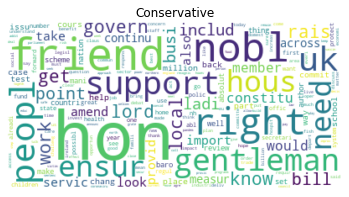

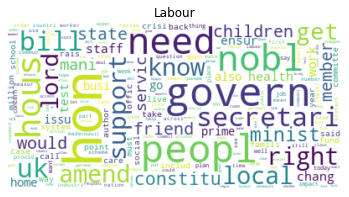

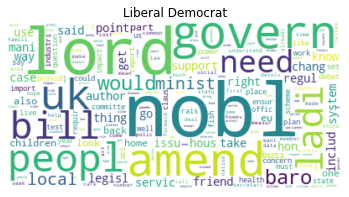

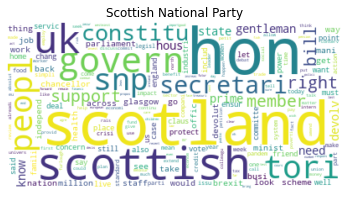

In [49]:
for i in Chosen_parties:
    fdist = dict(nltk.FreqDist(corpus[i]))
    tf_idf_dict = {}
    for key in fdist:
        tf_idf_dict[key] = idf_dict[key] * fdist[key]
    wordcloud = WordCloud(background_color='white').generate_from_frequencies(tf_idf_dict)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(i)
    plt.show()

## Proof of concept
The next section will try to leverage premade sklearn functions for conducting the tf-idf, and see if the results are aligned.

In [3]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [4]:
import ast
ParlaMint['tokens'] = ParlaMint['tokens'].apply(lambda x: ast.literal_eval(x))

In [5]:
corpus_sklearn = []
stopwords = ['hon', 'nobl', 'baro', 'uk']
parties = ParlaMint.Speaker_party_name.dropna().unique()
for party in tqdm(parties):
    temp = ParlaMint[ParlaMint['Speaker_party_name']==party]
    doc = [x for sublist in temp['tokens'] for x in sublist if x not in stopwords]
    corpus_sklearn.append(doc)

100%|███████████████████████████████████████████| 47/47 [00:15<00:00,  3.10it/s]


In [6]:
len(corpus_sklearn)

47

## Our TF-IDF Implementation

In [7]:
import numpy as np
import pandas as pd 
from pandas import DataFrame
from nltk.probability import FreqDist
from sklearn.feature_extraction.text import TfidfVectorizer


def TFIDF(corpus: list, min_df=0, max_df=1) -> DataFrame:
    '''
    corpus: A list of lists containing tokenized documents
    min_df: Threshold for removal of non-frequent words
    max_df: Threshold for removal of very frequent words

    The following function calculates and outputs the TF-IDF weighted term-document matrix.
    Notice that the IDF formulation used in this function deviates from the standard text book formula:
     * Adding 1 to the IDF ensures that terms with zero idf e.g. terms occuring in all documents are not completly ignored.
     * Hence, using idf(t) = log [ n / df(t) ] + 1 instead of idf(t) = log [ n / (df(t) + 1) ]).
    Furthermore, the IDF is also smoothened to avoid division by zero, by essentially pretendind that an extra document is added containing all terms to avoid division by zero:
     * idf(t) = log [ (n+1) / df(t+1) ] + 1
    '''
    N = len(corpus)

    if min_df != 0 or max_df != 1:
        term_set = set([x for sublist in corpus for x in sublist])
        doc_freq = dict.fromkeys(term_set, 0)
        for term in term_set:
            for doc in corpus:
                if term in doc:
                    doc_freq[term] += 1
        doc_freq = {key: value/N for (key, value) in doc_freq.items()}
        term_set = set([term for (term, value) in doc_freq.items() if value < max_df and value > min_df])
    else:
        term_set = set([x for sublist in corpus for x in sublist])

    idf_dict = dict.fromkeys(term_set, 0)
    tfidf_dicts = [None] * N
    tf_dicts = [None] * N
    idx = 0
    for doc in corpus:
        tf_dict = dict.fromkeys(term_set, 0)
        tf_dict.update({key: value/len(doc) for (key, value) in dict(FreqDist(doc)).items() if key in term_set}) #Normalized frequencies
        tf_dicts[idx] = tf_dict
        for (term, freq) in tf_dict.items():
            if freq > 0:
                idf_dict[term] += 1
        idx += 1

    idf_dict = {term: np.log( (N + 1) / (float(value) + 1)) + 1 for (term, value) in idf_dict.items()}
    for i in range(N):
        tf_dict = tf_dicts[i]
        temp = {term: tf_dict[term] * idf_dict[term] for term in term_set}
        tfidf_dicts[i] = {term: value / (np.sqrt(sum([x**2 for x in list(temp.values())]))) for (term, value) in temp.items()} #Converting to unit norm with l2

    return pd.DataFrame(tfidf_dicts)

In [8]:
TDM = TFIDF(corpus_sklearn, max_df = 0.7, min_df = 0.05)

KeyboardInterrupt: 

## Sklearn's TF-IDF Implementaion

In [9]:
def dummy_fun(doc):
    return doc
vectorizer = TfidfVectorizer(min_df=5, max_df = 0.7, analyzer='word',
    tokenizer=dummy_fun,
    preprocessor=dummy_fun,
    token_pattern=None)
vecs = vectorizer.fit_transform(corpus_sklearn)
feature_names = vectorizer.get_feature_names()
dense = vecs.todense()
lst1 = dense.tolist()
df = pd.DataFrame(lst1, columns=feature_names).dropna()
df.index = parties

/Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [8]:
df

,aa,aarhu,aaron,ababa,aback,abandon,abat,abattoir,abba,abbey,...,zuckerberg,zurich,à,ça,école,être,í,ís,ó,šefčovič
Liberal Democrat,0.000354,0.000614,0.000048,0.000678,0.000630,0.012481,0.000872,0.001256,0.000194,0.000884,...,0.000253,0.000318,0.000212,0.000056,0.000056,0.000455,0.000112,0.000056,0.000000,0.000000
Conservative,0.000477,0.000121,0.000270,0.000172,0.000315,0.004307,0.000375,0.000684,0.000517,0.001029,...,0.000133,0.000172,0.000172,0.000043,0.000009,0.000203,0.000086,0.000060,0.000009,0.000337
Labour,0.000559,0.000126,0.000302,0.000192,0.000343,0.011041,0.000604,0.000501,0.000494,0.000738,...,0.000272,0.000270,0.000120,0.000032,0.000047,0.000186,0.000047,0.000016,0.000000,0.000063
Scottish National Party,0.000116,0.000321,0.000111,0.000056,0.000278,0.008810,0.000334,0.000000,0.000000,0.001231,...,0.000116,0.000183,0.000000,0.000257,0.000000,0.000000,0.000257,0.000064,0.000064,0.000064
UK Independence Party,0.000000,0.000000,0.000000,0.000000,0.000000,0.012398,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Green Party,0.000000,0.000000,0.000783,0.000000,0.000000,0.011134,0.000000,0.000753,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Plaid Cymru,0.000393,0.000000,0.000000,0.000000,0.000000,0.006521,0.000754,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.001180,0.000000,0.000000,0.000000,0.000000
Democratic Unionist Party,0.000000,0.000000,0.000495,0.000165,0.000495,0.003160,0.000165,0.000475,0.000330,0.003645,...,0.000000,0.000000,0.000722,0.000000,0.000000,0.000861,0.000570,0.000190,0.003610,0.000190
-,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.001913,0.000000,0.000000,0.000000,0.000000,0.000000
Social Democratic & Labour Party,0.000000,0.000000,0.000000,0.000000,0.000000,0.009956,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


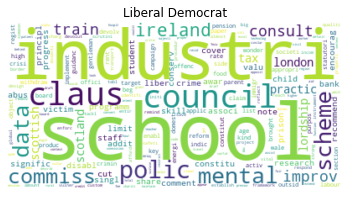

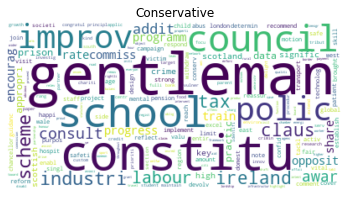

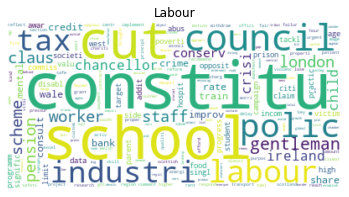

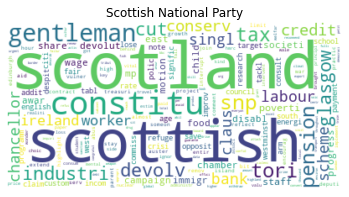

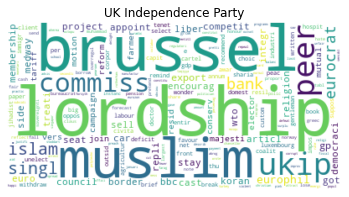

...

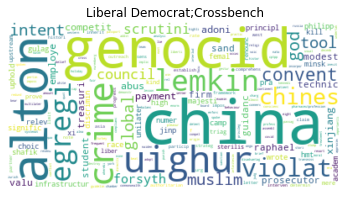

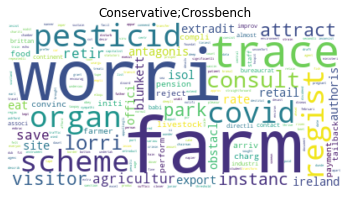

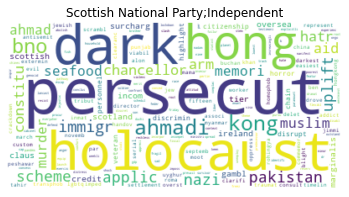

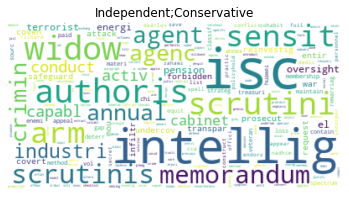

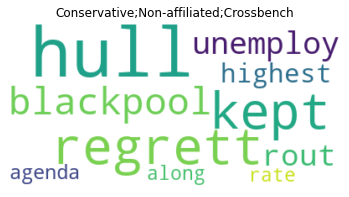

In [24]:
for i in range(len(df)):
    Cloud = WordCloud(background_color='white').generate_from_frequencies(df.iloc[i,:])
    plt.imshow(Cloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{df.index[i]}')
    plt.savefig(f'clouds/wordcloud_{df.index[i]}.pdf', dpi = 200)
    plt.show()

## Party similarity (TF-IDF & Cosine similarity)
Once the term-document matrix with TF-IDF weighting have been determined, the cosine similarity between each document can be used to determine similarity between documents, and thereby between parties.

In [24]:
subset_parties = ['Liberal Democrat', 'Conservative', 'Labour', 'Scottish National Party', 'UK Independence Party']

In [25]:
term_doc_matrix = df.loc[subset_parties].to_numpy()
term_doc_matrix

array([[3.53982627e-04, 6.13579102e-04, 4.84354663e-05, ...,
        5.57799184e-05, 0.00000000e+00, 0.00000000e+00],
       [4.77258880e-04, 1.20822046e-04, 2.69777833e-04, ...,
        6.04110229e-05, 8.63014612e-06, 3.36575699e-04],
       [5.58788720e-04, 1.26434902e-04, 3.01915411e-04, ...,
        1.58043628e-05, 0.00000000e+00, 6.32174511e-05],
       [1.16296259e-04, 3.20700562e-04, 1.11389774e-04, ...,
        6.41401125e-05, 6.41401125e-05, 6.41401125e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

Given that sklearns TFIDF vectorizer already normalizes the cosine similarity can simply determined as follows:

In [26]:
sim_matrix = (term_doc_matrix @ term_doc_matrix.T)

Lets depict the similarity matrix using a heatmap:

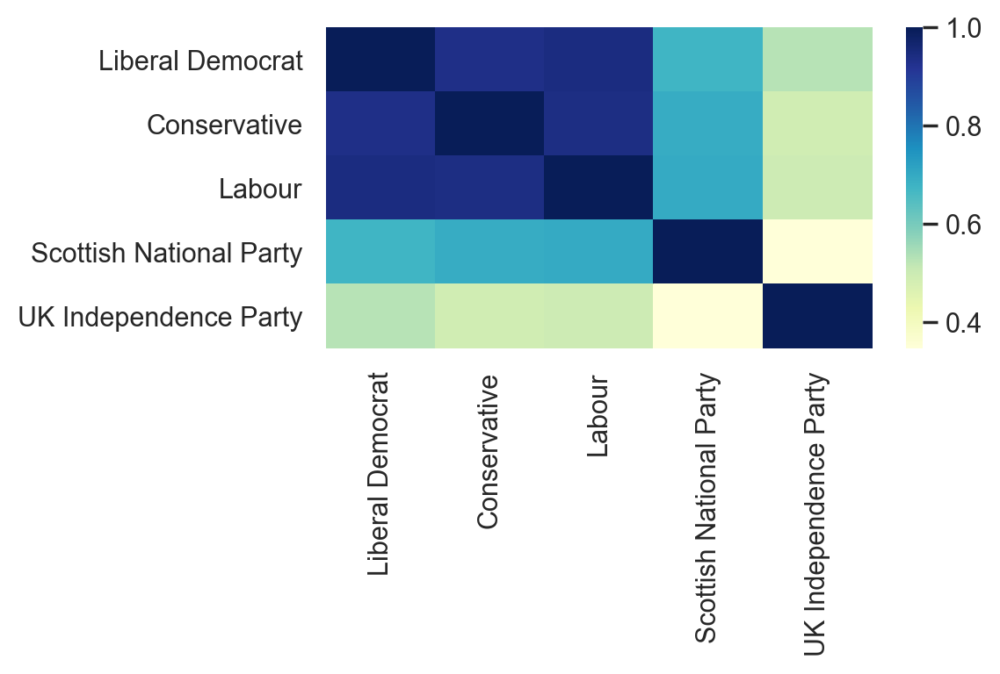

In [32]:
import seaborn as sns; sns.set_theme()
fig, ax = plt.subplots(dpi=200)
sns.heatmap(sim_matrix, xticklabels=subset_parties ,yticklabels=subset_parties, cmap="YlGnBu")
plt.tight_layout()
plt.savefig('Party_similarity.pdf', dpi=200)

## Bubble plots

In [16]:
ParlaMint.iloc[0,:]['Text']

'On behalf of the whole House, I wish to express my deepest sympathies with the people of Australia as they continue to experience horrific wildfires, which are laying waste so much, and to send a message of solidarity to our Commonwealth colleagues in the Australian Parliament. We pay tribute to the firefighters and to all those who are putting their lives at risk The magnitude of the disaster unfolding in Australia should shock us all, with human and animal lives and precious species of fauna being destroyed. This is a wake-up call for the world. All Australians are in our thoughts and prayers. I rang the Speaker of the Australian House of Representatives five days ago to express our worries and concerns. There will be an oral statement on Thursday, so Members who wish to speak on the matter will be able to do so then I draw Members’ attention to the fact that the book for entering the private Member’s Bill ballot is now open. It will be open until the House rises today and while the

In [30]:
test = {}
test['1234'] = dict(nltk.FreqDist([x for x in nltk.tokenize.word_tokenize(ParlaMint.iloc[0,:]['Text'].lower()) if x == "order"]))
pd.DataFrame.from_dict(test, orient='index')



,order,or
1234,2.0,NaN
12345,NaN,2.0


In [2]:
ParlaMint = pd.read_csv("parlamint_preprocess.csv")

In [25]:
import plotly.io as pio

def word_frequency(word, start_date, end_date, ParlaMint):

    ParlaMint['date'] = pd.to_datetime(ParlaMint['From'])
    mask = (ParlaMint['date'] > start_date) & (ParlaMint['date'] <= end_date)
    ParlaMint = ParlaMint.loc[mask]
    dates = ParlaMint["date"].unique()
    freq_pr_day = {}
    for date in dates:
        temp = ParlaMint[ParlaMint['date']==date]
        doc = ' '.join(temp['Text']).lower()
        freq_pr_day[date] = len([x for x in nltk.tokenize.word_tokenize(doc.lower()) if x ==word])
    df = pd.DataFrame.from_dict(freq_pr_day, orient='index', columns=['count']).fillna(0)
    df['date'] = df.index
    return df

def create_bubblelines(words, start_date, end_date, ParlaMint):
    '''
    https://github.com/wragge/hansard-language/blob/3f6c954d8fcc519bbde366241b6de84e3ca7cd58/analysis.py#L863
    '''
    traces = []
    for word in tqdm(words):
        dates = []
        counts = []
        labels = []
        text = []
        results = word_frequency(word, start_date, end_date, ParlaMint)
        for i in range(len(results)):
            dates.append(results.iloc[i,:]['date'])
            counts.append(results.iloc[i,:]['count'])
            text.append('{} uses'.format(results.iloc[i,:]['count']))
            labels.append(word)
        trace = dict(
            type='scatter',
            x=dates,
            y=labels,
            text=text,
            mode='markers',
            marker=dict(
                size=counts,
                opacity=0.4,
                sizemode="area"
            ),
            hoverinfo='x+text'
        )
        traces.append(trace)
    layout = go.Layout(
        title='Lexical Dispersion Plot - British Parliament',
        #xaxis=dict(
        #    title='Date'
        #),
        yaxis=dict(
            tickfont=dict(
                size=14
            )
        ),
        margin=dict(
            l=120,
            r=80,
            t=100,
            b=100
        ),
        showlegend=False
    )
    figure = dict(data=traces, layout=layout)
    return figure
words = ['education', 'health', 'eu', 'immigration', 'crime', '']
start_date = "2015-01-01" 
end_date = "2021-12-30"

fig = create_bubblelines(words, start_date, end_date, ParlaMint)
pio.show(fig)

100%|███████████████████████████████████████████████████████████████| 6/6 [1:09:26<00:00, 694.45s/it]


In [6]:
import pickle

with open('lexicalDisperisonPlot.json', 'wb') as fp:
    pickle.dump(fig, fp, protocol=pickle.HIGHEST_PROTOCOL)

In [26]:
temp = pio.show(fig)

In [14]:
pio.write_json(fig, 'lexicalDisperisonPlot.json')

In [12]:
pio.write_html(fig, 'lexicalDisperisonPlot.html')

In [16]:
pio.read_json('lexicalDisperisonPlot.json')

In [17]:
import plotly.graph_objects as go

In [18]:
temp_fig =go.Figure(fig)

In [22]:
with open('lexicalDisperisonPlot.json', 'wb') as fp:
    pickle.dump(temp_fig.to_json(), fp, protocol=pickle.HIGHEST_PROTOCOL)

In [26]:
temp_fig.to_json("lexicalDisperisonPlot.json")

'{"data":[{"hoverinfo":"x+text","marker":{"opacity":0.4,"size":[59,31,109,41,197,8,47,70,2,36,49,22,22,63,32,18,16,28,31,6,14,30,16,45,14,23,40,69,49,9,80,164,12,83,40,43,74,46,34,71,41,31,32,2,5,2,9,9,11,19,20,4,21,56,12,39,17,11,26,8,21,14,5,11,17,15,69,20,74,14,46,14,60,60,25,31,28,12,27,39,175,10,114,59,53,3,5,14,29,19,16,5,30,46,14,16,5,0,5,55,45,17,41,44,120,17,2,23,15,23,14,3,18,28,42,19,2,31,63,11,81,31,62,15,20,3,74,51,5,34,12,20,107,43,17,2,10,4,25,3,23,14,12,8,9,21,11,24,10,10,23,20,91,30,19,36,2,12,9,20,58,14,21,4,15,23,14,15,58,112],"sizemode":"area"},"mode":"markers","text":["59 uses","31 uses","109 uses","41 uses","197 uses","8 uses","47 uses","70 uses","2 uses","36 uses","49 uses","22 uses","22 uses","63 uses","32 uses","18 uses","16 uses","28 uses","31 uses","6 uses","14 uses","30 uses","16 uses","45 uses","14 uses","23 uses","40 uses","69 uses","49 uses","9 uses","80 uses","164 uses","12 uses","83 uses","40 uses","43 uses","74 uses","46 uses","34 uses","71 uses","41 u

In [27]:
fig

{'data': [{'type': 'scatter',
   'x': [Timestamp('2020-01-07 00:00:00'),
    Timestamp('2020-01-08 00:00:00'),
    Timestamp('2020-01-09 00:00:00'),
    Timestamp('2020-01-13 00:00:00'),
    Timestamp('2020-01-14 00:00:00'),
    Timestamp('2020-01-15 00:00:00'),
    Timestamp('2020-01-16 00:00:00'),
    Timestamp('2020-01-20 00:00:00'),
    Timestamp('2020-01-21 00:00:00'),
    Timestamp('2020-01-22 00:00:00'),
    Timestamp('2020-01-23 00:00:00'),
    Timestamp('2020-01-27 00:00:00'),
    Timestamp('2020-01-28 00:00:00'),
    Timestamp('2020-01-29 00:00:00'),
    Timestamp('2020-01-30 00:00:00'),
    Timestamp('2020-02-03 00:00:00'),
    Timestamp('2020-02-04 00:00:00'),
    Timestamp('2020-02-05 00:00:00'),
    Timestamp('2020-02-06 00:00:00'),
    Timestamp('2020-02-07 00:00:00'),
    Timestamp('2020-02-10 00:00:00'),
    Timestamp('2020-02-11 00:00:00'),
    Timestamp('2020-02-12 00:00:00'),
    Timestamp('2020-02-13 00:00:00'),
    Timestamp('2020-02-24 00:00:00'),
    Timestamp('